In [1]:
import pylab as pl
import numpy as np
import matplotlib.pyplot as pl
import random
%matplotlib inline

In [2]:
# Generate the data
xmin = 0
xmax = 6.28
num_points = 100

# Generate 2Hz + 3Hz noise-free sine wave
data = np.sin(2*np.linspace(xmin,xmax,num_points)) + np.sin(3*np.linspace(xmin,xmax,num_points))

data = data/5 

Dividing with five, so that shape of the curve is same but value is well within (-1 and 1). I did this because tanh function reaches value = 1 at infinity, For our RNN model to predict a value of 1 OR 2, the activation potential has to reach a very high value, causing our weights to be very high and making convergence difficult

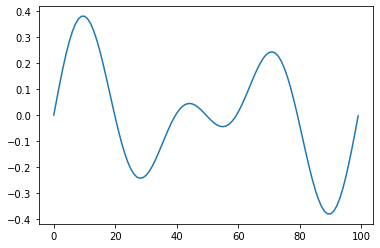

In [3]:
_ = pl.plot(data)

In [8]:
class simpleRNN:
    def __init__(self, neurons, lr_rate):
        self.neurons = neurons # TODO Try different values
        self.ip_dim = 1 # Input dimension
        self.op_dim = 1 # Output dimension
        self.lr = lr_rate# Learning rata TODO Try different values

        self.U = np.ones([self.ip_dim, self.neurons])
        self.W = np.random.normal(0, 1, (self.neurons, self.neurons))
#         self.W = np.random.uniform(0,1,(self.neurons, self.neurons))
        self.V = np.random.randn(self.neurons, self.op_dim)
        self.h = np.zeros((1,self.neurons))

    
    #Avoiding bias terms in the weights as the sin waves are centered around x-axis.
    def feedforward(self, x, train=False):
        self.yhat = 0
        for input_sig in x:
            input_sig = np.array(input_sig)
            input_sig = input_sig.dot(self.U)
            
            input_sig = input_sig + self.h.dot(self.W)
            input_sig = self.sigmoid(input_sig)
            
            self.h = input_sig
            input_sig = self.sigmoid(input_sig.dot(self.V))
            self.yhat = input_sig
            
        if not train:
            self.h = self.h*0
            
        return self.yhat
        
    def backprop(self, y):
        error = (y-self.yhat)
        dw = self.lr * error * self.der_sigmoid(self.yhat) * self.h.T
        self.V = self.V + dw
        self.h = self.h*0
        
    def der_sigmoid(self, val):
        return 1-val**2

    def compute_loss(self, y):
        loss = self.compute_error(self.yhat, y)
        return loss
    
    def sigmoid(self, s):
        return np.tanh(s)


    def compute_error(self, pred, real):
        error = pred - real
        loss = 0.5*(error.T.dot(error))
        return loss

model = simpleRNN(5, 0.01)

*Since "h" stores the previous value, I have passed a separate parameter, which removes the value from h, if it is not being used for training. I did this because, when I am testing this on examples, the previous value of "h" is already present in the model and it is not cleared, so when we start prediction for a new batch, We will already have value for "h".
Value of "h" is also cleared after backpropagation. The value of "h" is needed for backpropagation, to calculate the new value of V.*

In [9]:
pl.rcParams["figure.figsize"] = (13,5)
results = {}
def plot_lr_curve(loss):
    fig, axs = pl.subplots(1, 2)
    axs[0].plot(loss)
    _ = axs[0].set_xlabel('Iteration')
    _ = axs[0].set_ylabel('Error')
    return fig, axs
    
def plot_predictions(fig, axs, model, batch_size, lr, neurons, noise, randome = False):
    y = []
    y_true = []
    for start_time in range(len(data)-batch_size-1):
        if randome:
            start_time = np.random.randint(len(data) - batch_size - 1)
        data_noise = data #+ np.random.normal(0, 0.1, num_points) # TODO add some noise at every trial 
        if noise:
            data_noise = data_noise + np.random.normal(0, 0.02, num_points)
        y.append(model.feedforward(data_noise[start_time:start_time+batch_size])[0][0])
        y_true.append(data_noise[start_time+batch_size])
    _ = axs[1].plot(y, label = "predicted")
    _ = axs[1].plot(y_true, label = "true")
    _ = axs[1].set_title("neurons:" +str(neurons) + " lr:" + str(lr) + " batch_size:" + str(batch_size))
    fig.tight_layout()
    pl.show()
    
def train_rnn(neurons, lr, batch_size, iterations, noise = False, lr_multiplier=1, lr_interval=1000000, randome=False, disable_w = False):
    model = simpleRNN(neurons, lr)
    if disable_w:
        model.W = model.W * 0
    loss = np.zeros((iterations,1))
    start_time = np.random.randint(0, num_points-batch_size-1)
    for i in range(iterations):
        if i%lr_interval == 0 and i != 0:
            model.lr = model.lr*lr_multiplier
        data_noise = data # + np.random.normal(0, 0.1, num_points) # TODO add some noise at every trial 
        if noise:
            data_noise = np.random.normal(0, 0.02, num_points) # Noise has been reduced
        start_time = random.randint(0, num_points-batch_size-1) # extra -1 for the prediction step
        model.feedforward(data_noise[start_time:start_time+batch_size], True)

        model.backprop(data_noise[start_time+batch_size])
        loss[i] = model.compute_loss(data_noise[start_time+batch_size])    
    avg_error = sum(loss[-500:]) / 500
    if neurons not in results:
        results[neurons] = {}
    if batch_size not in results[neurons]:
        results[neurons][batch_size] = {}
    if lr not in results[neurons][batch_size]:
        results[neurons][batch_size][lr] = 100000
    results[neurons][batch_size][lr] = min(avg_error, results[neurons][batch_size][lr])
    fig, axs = plot_lr_curve(loss)
    plot_predictions(fig, axs, model, batch_size, lr, neurons, noise, randome)
    return model

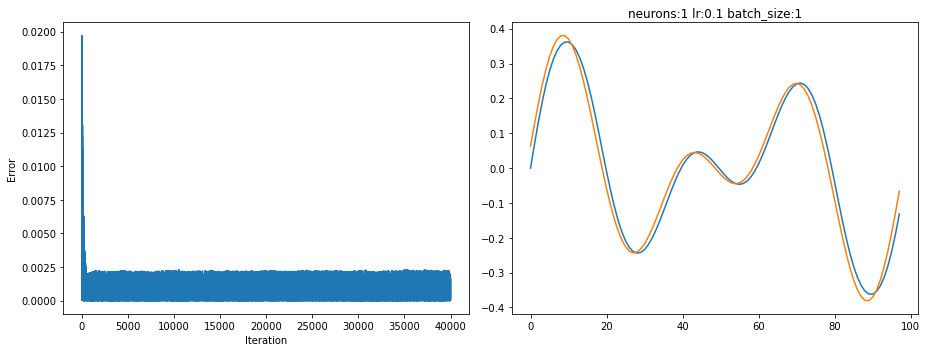

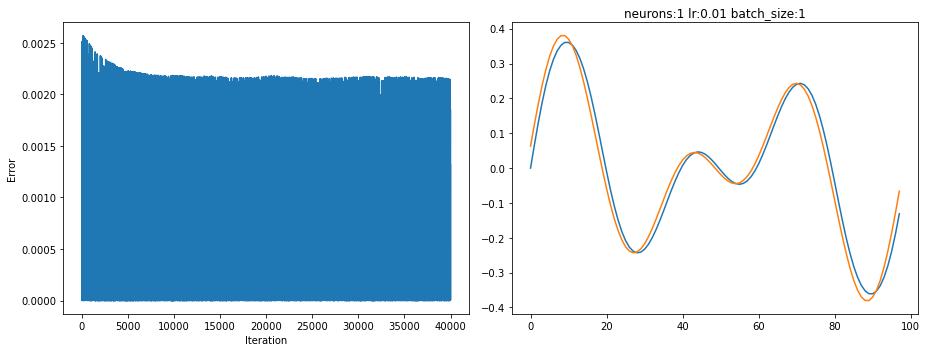

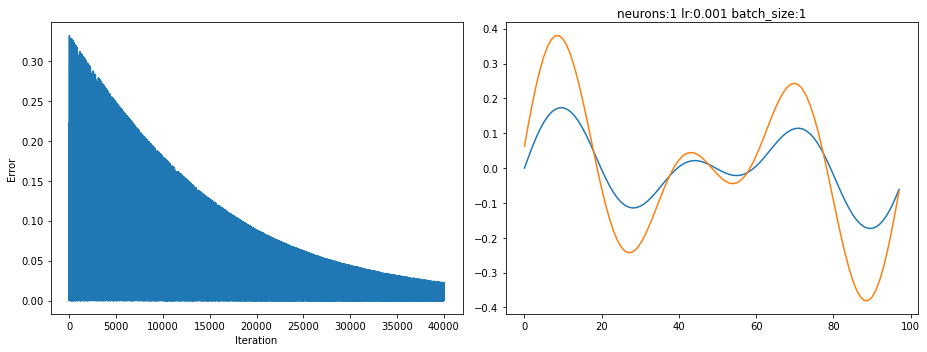

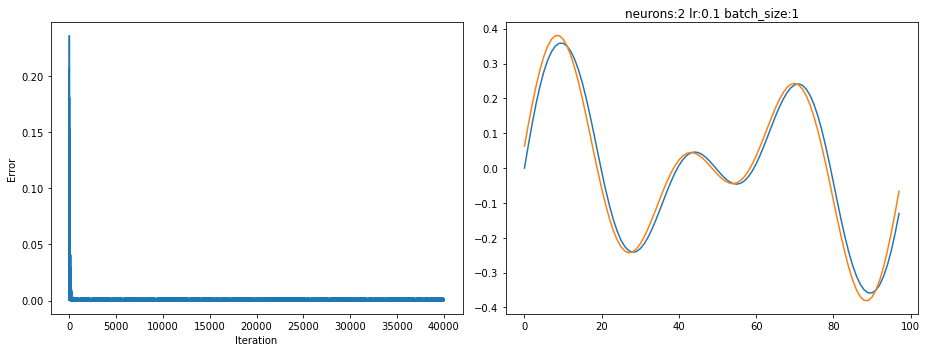

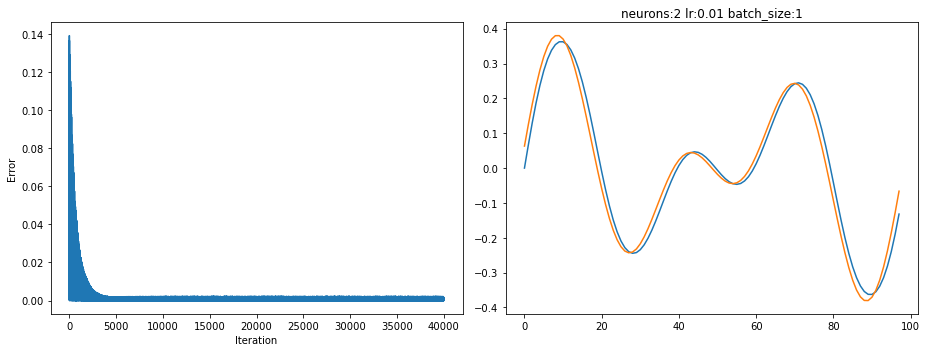

...

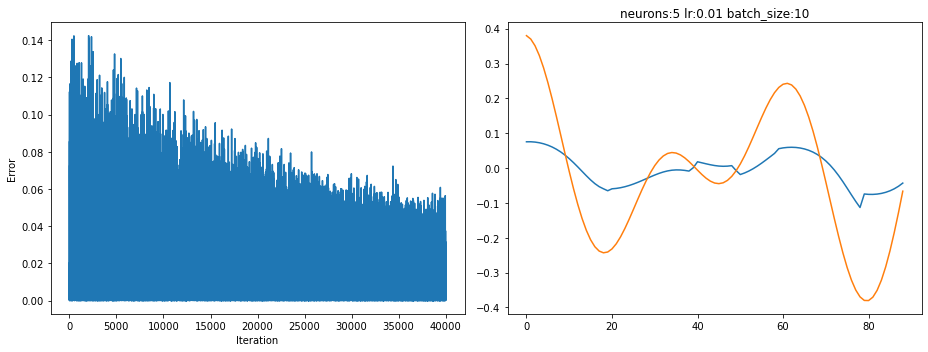

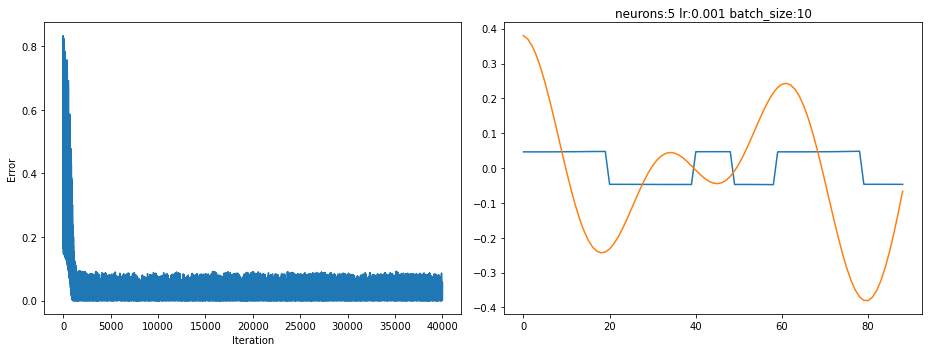

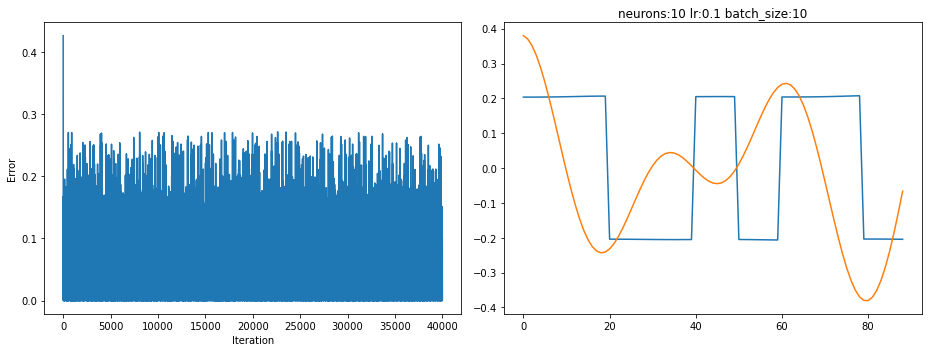

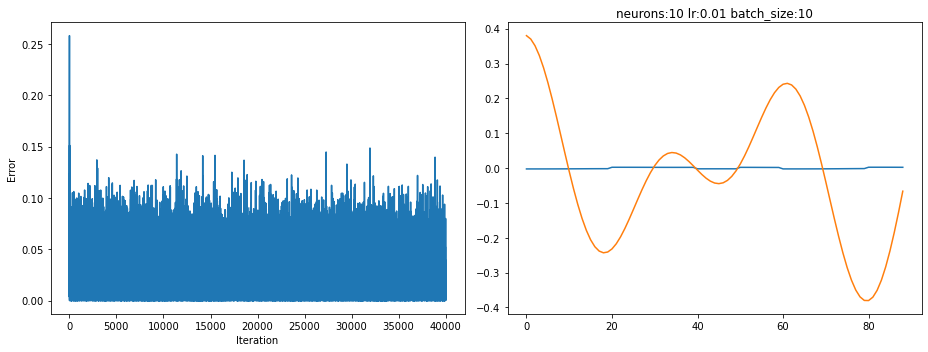

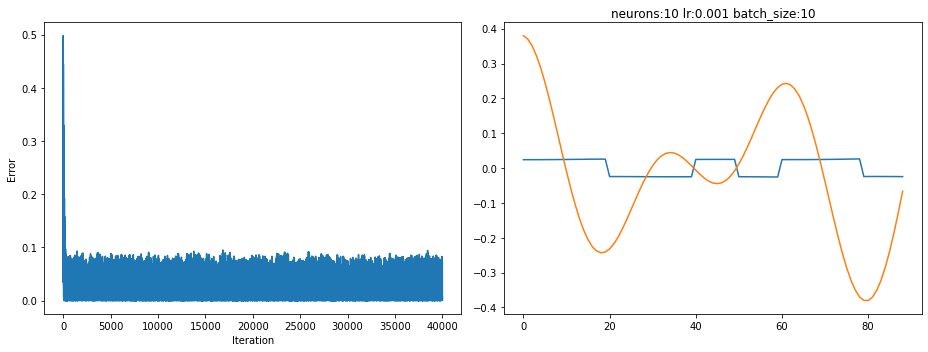

In [9]:
iterations = 40000

for batch_size in [1,2,3,5,10]:
    for neurons in [1,2,3,5,10]:
        for lr_rate in [0.1, 0.01, 0.001]:
            train_rnn(neurons, lr_rate, batch_size, iterations)


In the above cell, rnn model has been trained for 50k iterations, with varying learning rate, neurons, batch-size.

I see that with varying learning rate, the plot on the left side takes longer to bring the error down, while with higher learning rate the convergence happens faster. Higher learning rate also comes out of the local minima faster. I see that with a learning rate = 0.01 the convergence is faster.

When I see the results with respect to number of neurons, We can see that It basically doesnt impact the predictions. For example for a batch-size = 1, we have got good convergence for all neuron numbers. However for batch-size = 3, we see that when number of neurons are less, we have got a better convergence in most cases. When number of neurons are large, the convergenge is not so good in most cases.

Possible explanation for this could be that, when number of neurons are more, there are more local minimas to escape from. That could result in bad performance when neurons are more. When neurons are less, the there arent many local minimas to be trapped in for the weights.

When we see results with respect to batch_size, we see that when batch size increases, the predictions go bad.


So according to observations:
1) More batch size makes predictions go bad.

2) neurons determine the probability of good convergence, when neurons are higher, there are more local minimas to be trapped in. So when neurons are less the probability of a good convergence is slightly higher.

3) learning rate determines the epochs it takes to reach a minima. It also makes it possible to get out of a local minima by making larger jumps.

**How can single neuron predict sine wave output so well.**

***A possible explanation for this behaviour could be following***

In most cases the expected value is very close to the last value in the batch size. This is because from time t to t+1, the change in value is minimal. Our predictor might have learnt this rule. So when we predict the same value itself, we get a good prediction.

However if we increase batch size, the predictions arent good. This is because when batch size is large, the interference from t-1 and historical layers increase, which makes it hard to predict the same value as that of the input.

For large batch size and neurons, the predictions are almost flatlining, which could be the local minima that it is trapped in. When the batch size increase and number of neurons increase, it is difficult to find the weights that will predict the last input value in the batch size. As the complexity of this model increase with higher batch size and neurons and number of local minima's increase too.

Ideally it shouldnt be possible for a batch size = 1, to predict a sequence, because we arent providing any historical values. However that does happen, which indicates that the predictions are based on the current value only.


A better approach to predict a sequence should be to predict multiple values in the future, instead of a single one.

Next I will train a model for 2 batch size and predict the value for 1 batch size. 

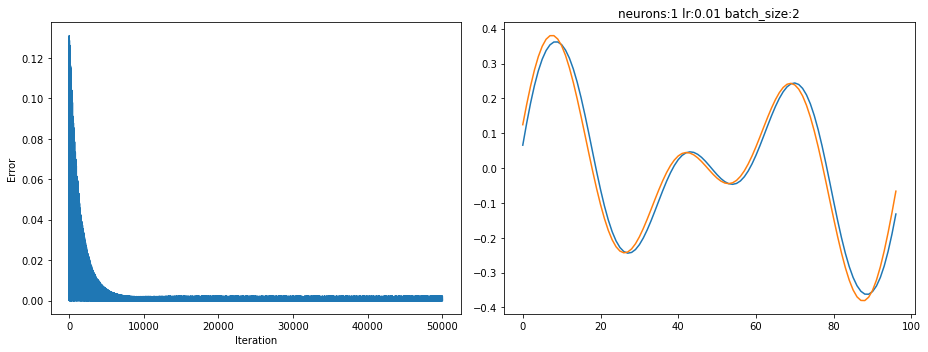

0.0  ->  0.0
0.05  ->  0.05211082144424428
0.1  ->  0.10368248223661014
0.15  ->  0.15420059563739238
0.2  ->  0.20319782788550117
0.25  ->  0.25027161726267655
0.3  ->  0.29509601642206457
0.35  ->  0.3374272260404542
0.4  ->  0.3771032159659418
0.45  ->  0.41403845354807967


In [45]:
model = train_rnn(1, 0.01, 2, 50000, False, 1, 50000)
for j in range(10):
    print(str(j/20) + "  ->  " + str(model.feedforward([j/20])[0][0]))

We see that the => f(x) ~ x

**With Noise**

As a next step, we will train our models from noisy data, on the data with noise. For this I will use learning rate of 0.01

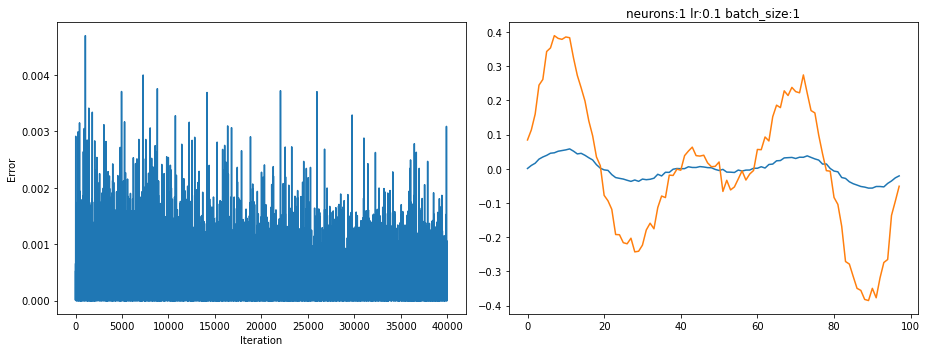

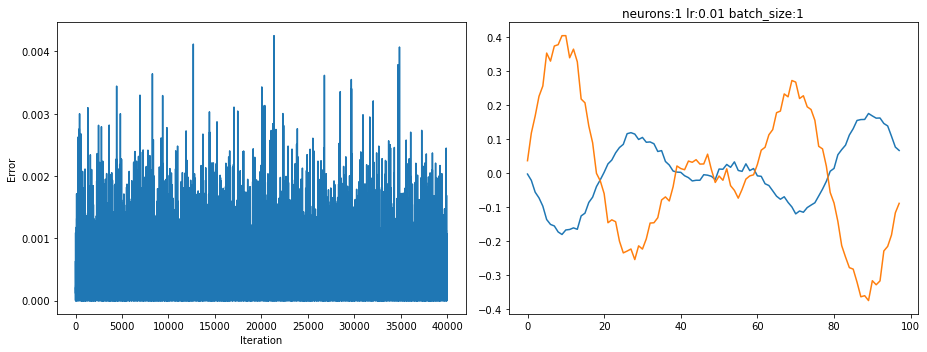

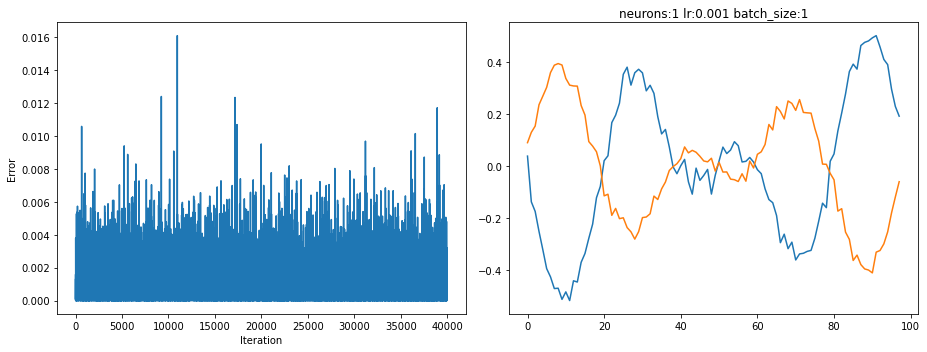

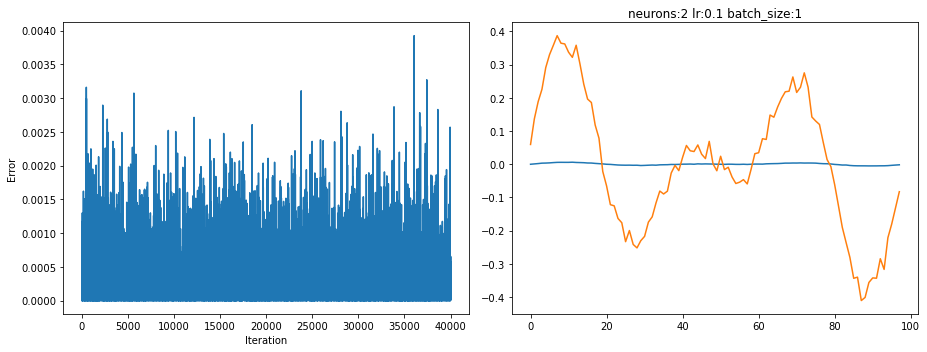

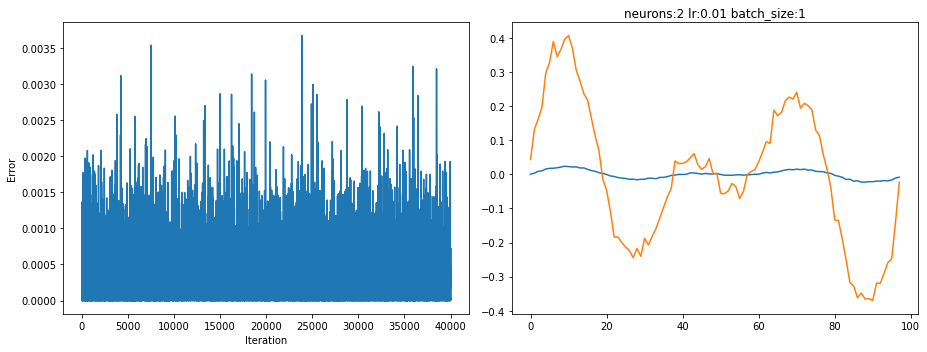

...

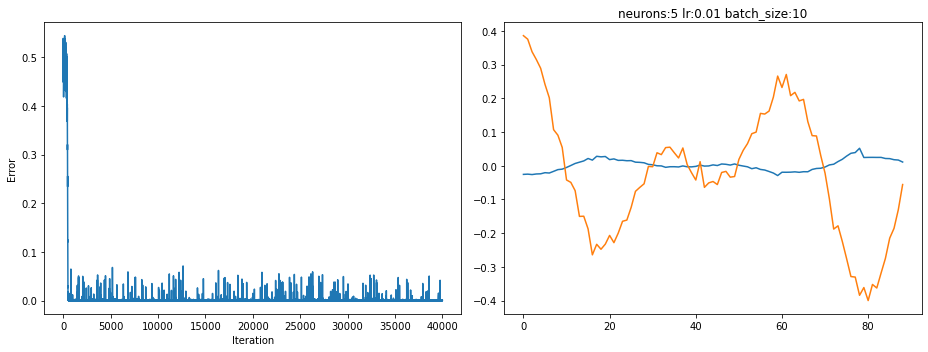

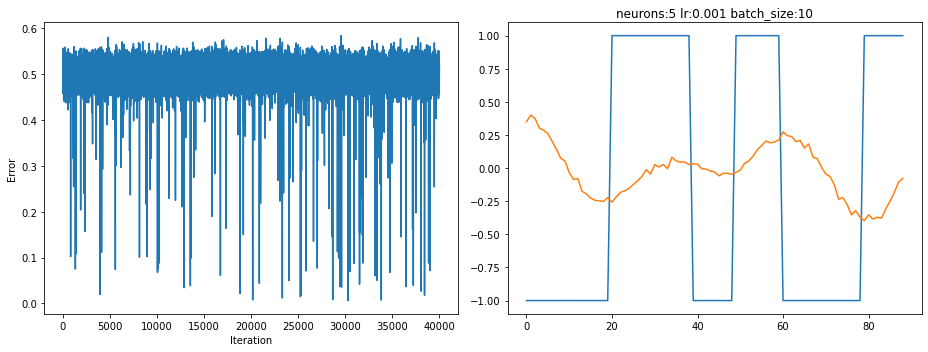

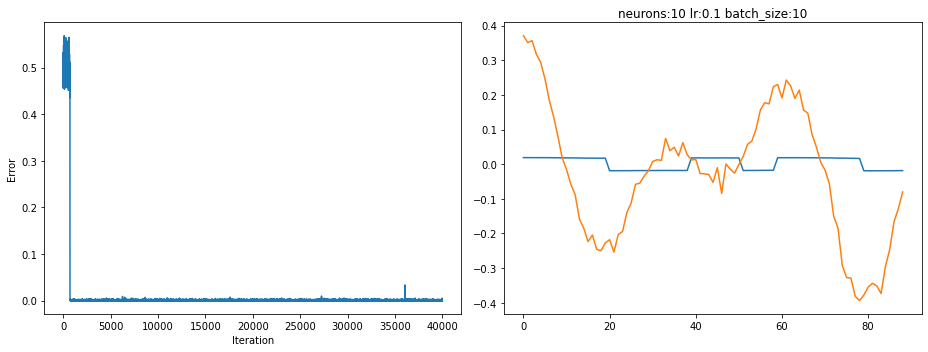

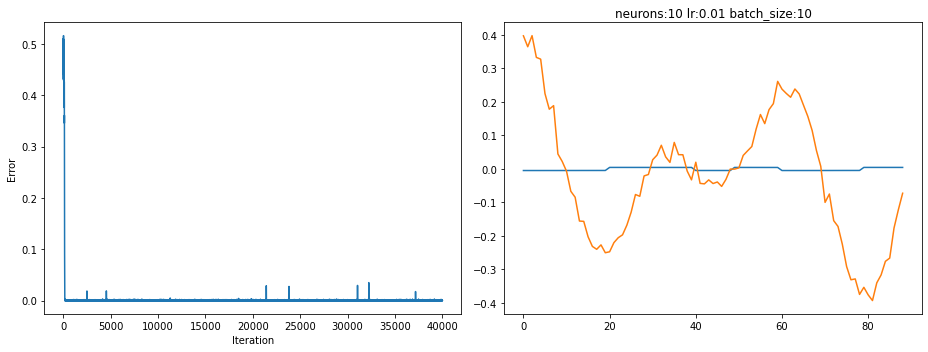

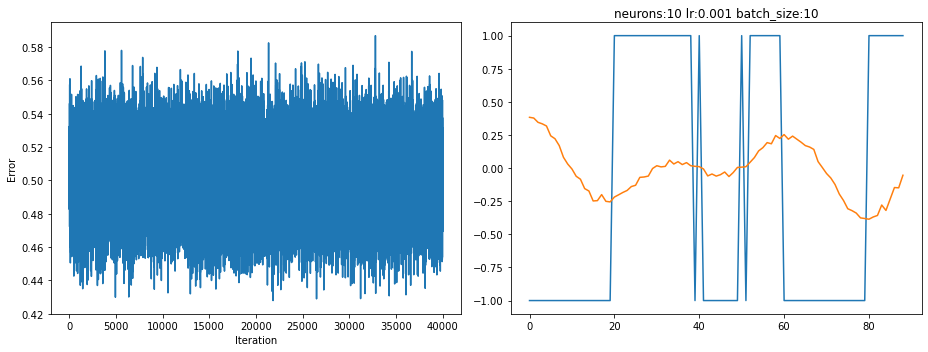

In [50]:
iterations = 40000

for batch_size in [1,2,3,5,10]:
    for neurons in [1,2,3,5,10]:
        for lr_rate in [0.1, 0.01, 0.001]:
            train_rnn(neurons, lr_rate, batch_size, iterations, noise = True)


With noise, whether the convergence will happen or not, depends on the initial conditions and initial weight initializations. For example in the below cell I will train the network on same value of neurons and batch-size multiple times. In few of these, the predictions are right and in few of these the predictions arent as good.

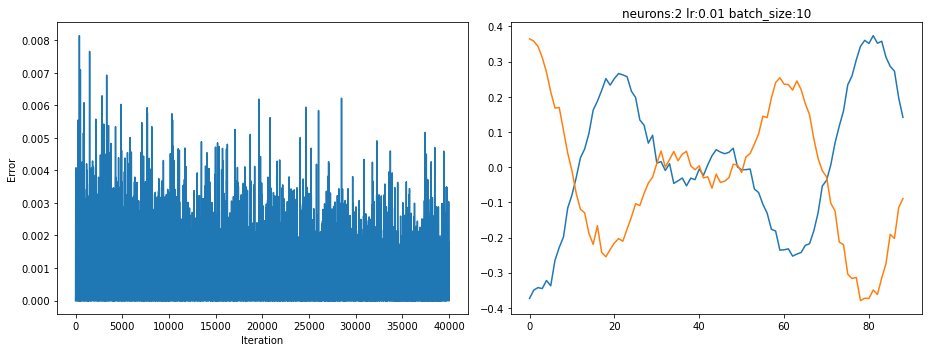

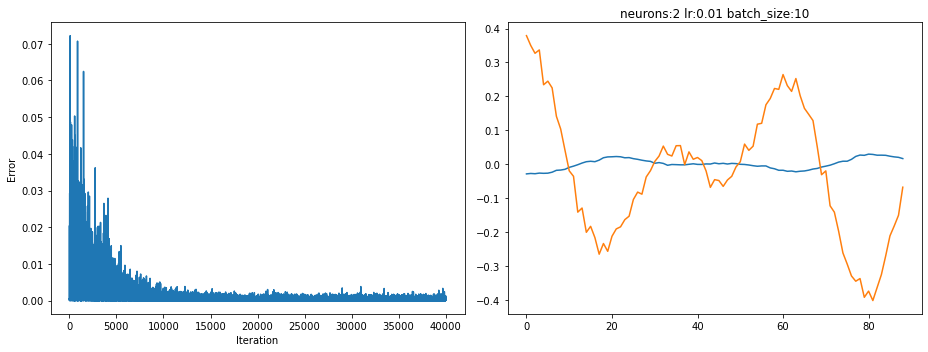

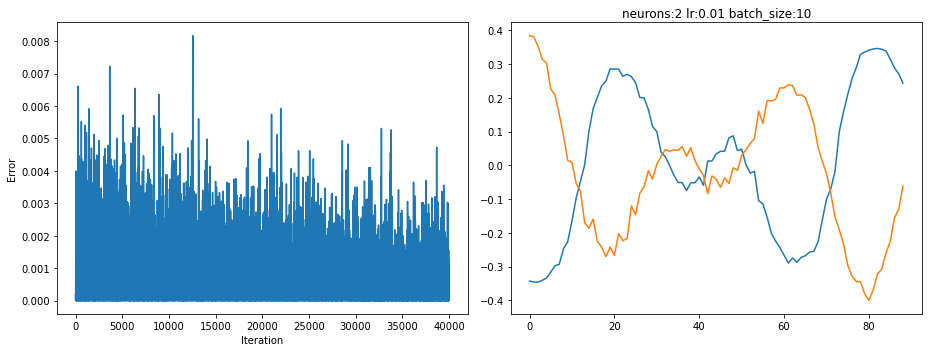

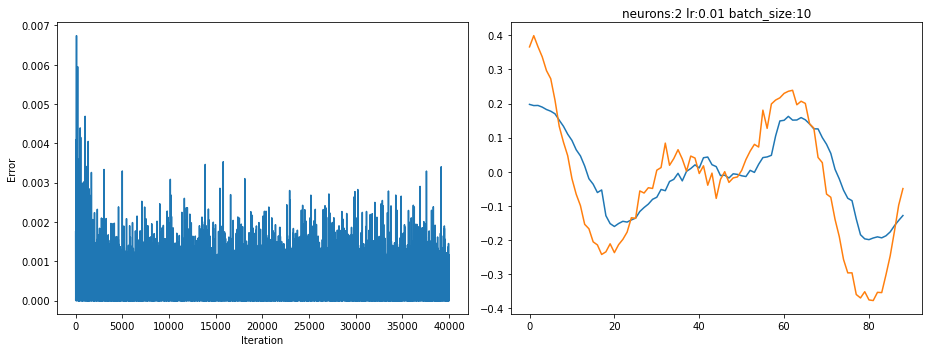

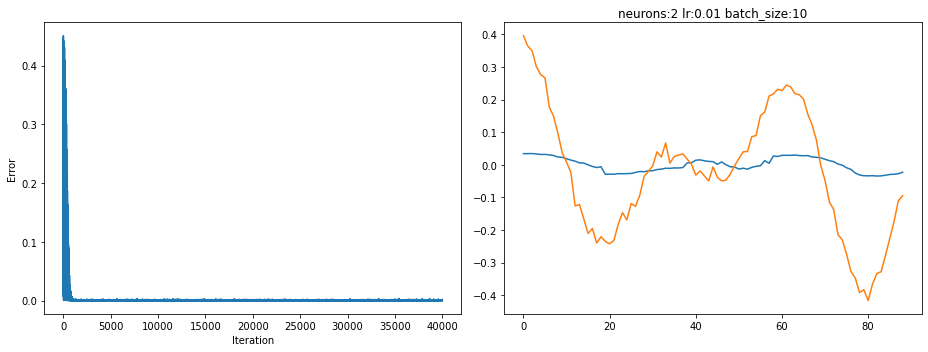

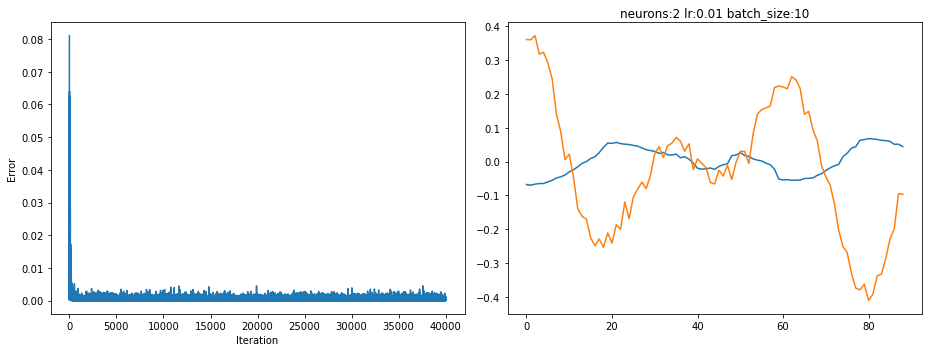

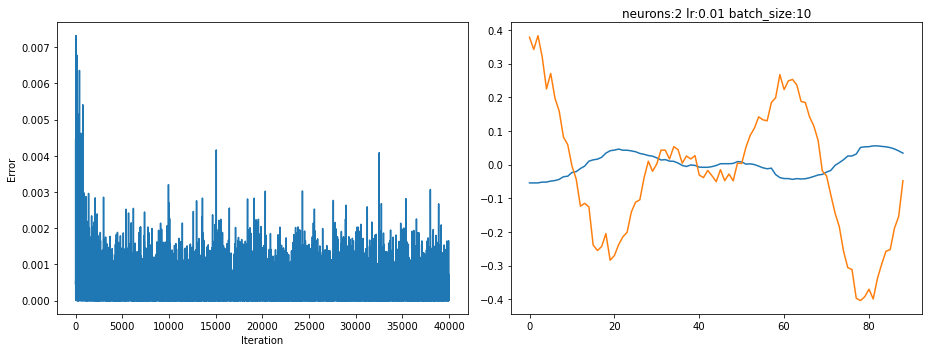

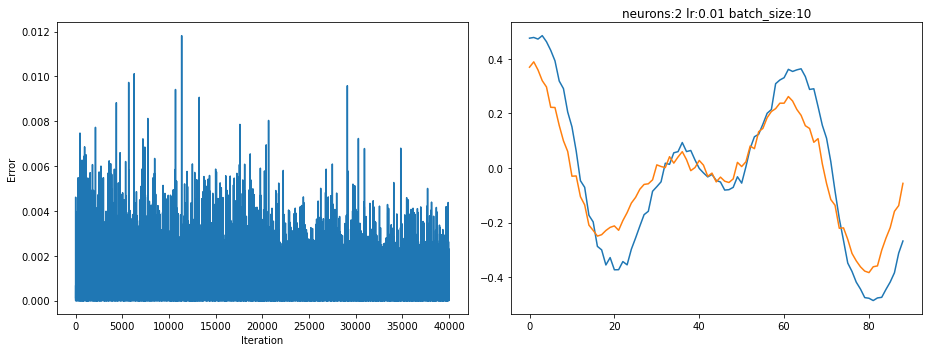

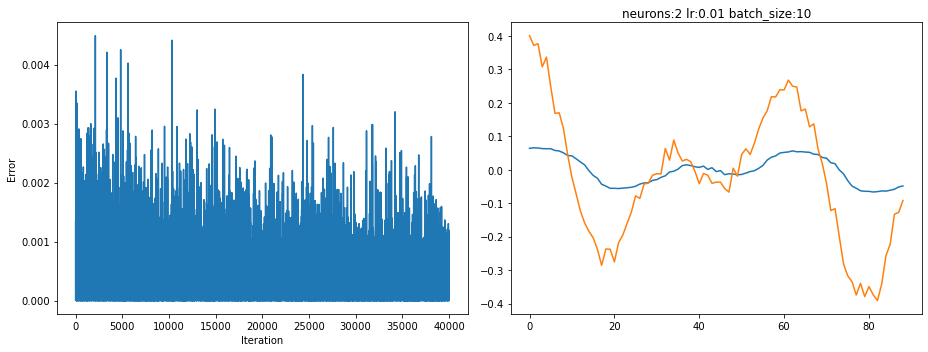

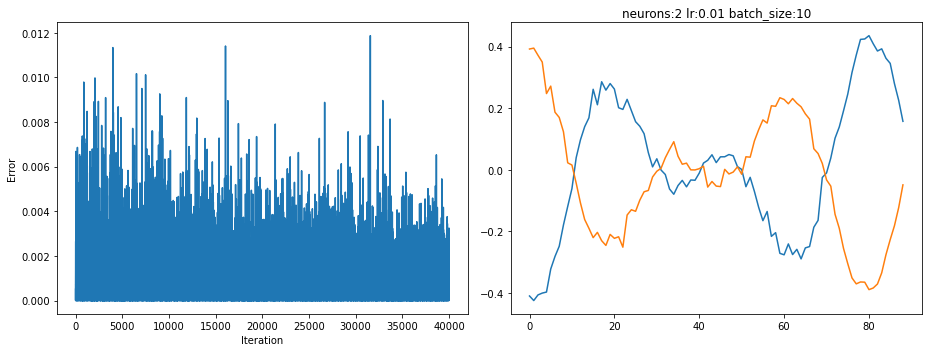

In [51]:
for i in range(10):
    train_rnn(2, 0.01, 10, 40000, noise = True)

In the above plot, I have used same number of neurons and batch_size. To showcase that whether the exploration will converge or not, depends on initial conditions and is almost random.

In the above plot we see that a lot of models have got trapped in the local minimas, while few have found the rule that 

f(x) ~ x, For those models the predictions are better.

With noise in the data, it is difficult to find the rule that f(x) ~ x, because sometimes the margin is large enough between x and f(x) to identify the rule and be trapped in some other local minima, or flatline the predictions.

However few models by chance are able to find better minima at f(x) ~ x. This can be seen in the above plot.

**Setting the W to zero**

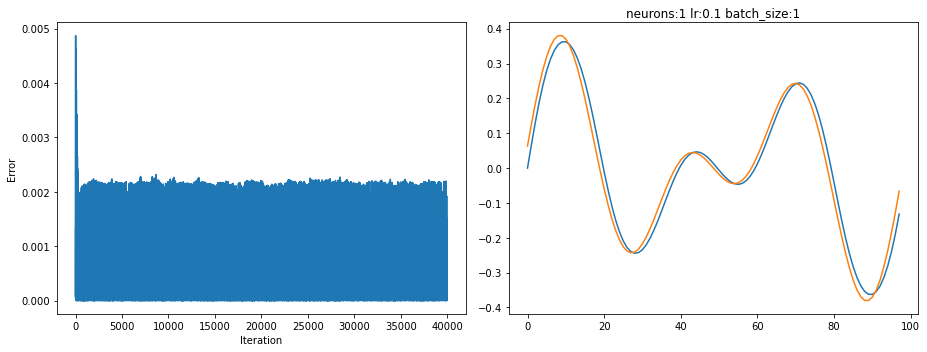

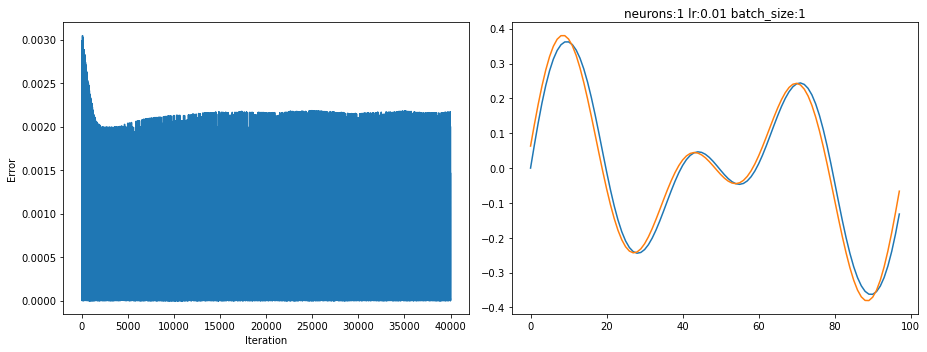

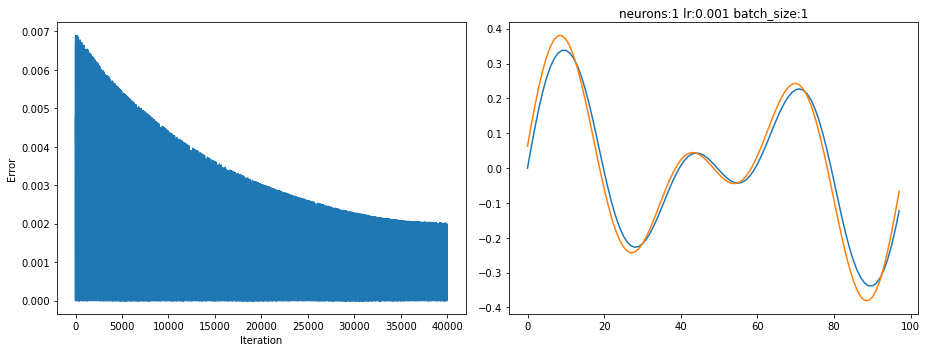

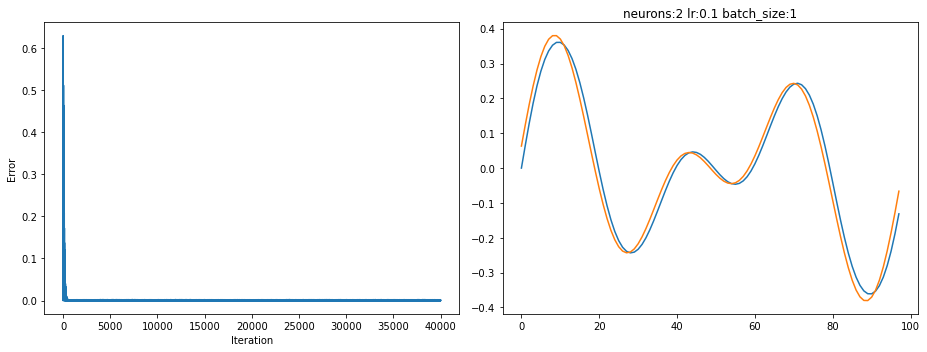

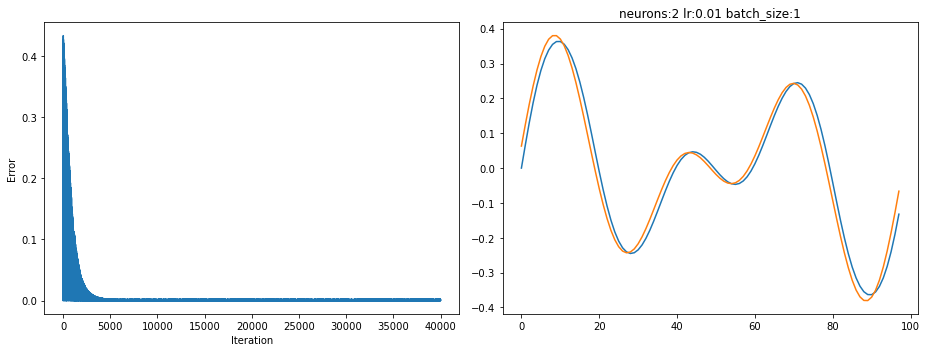

...

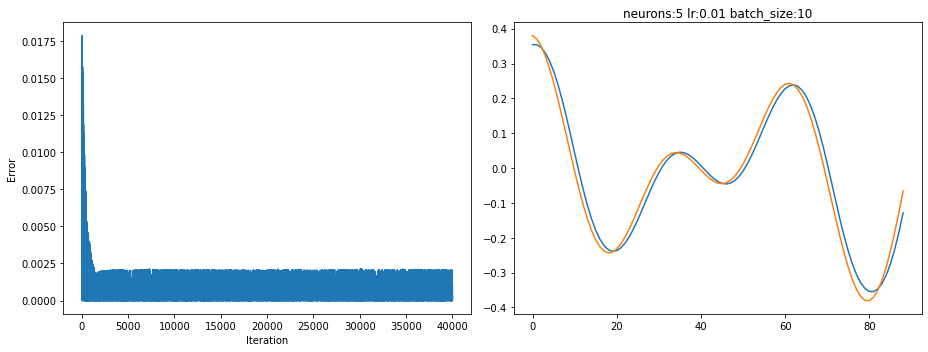

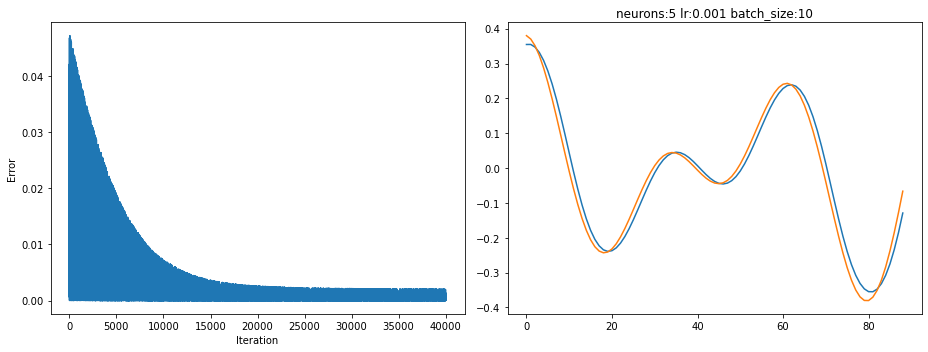

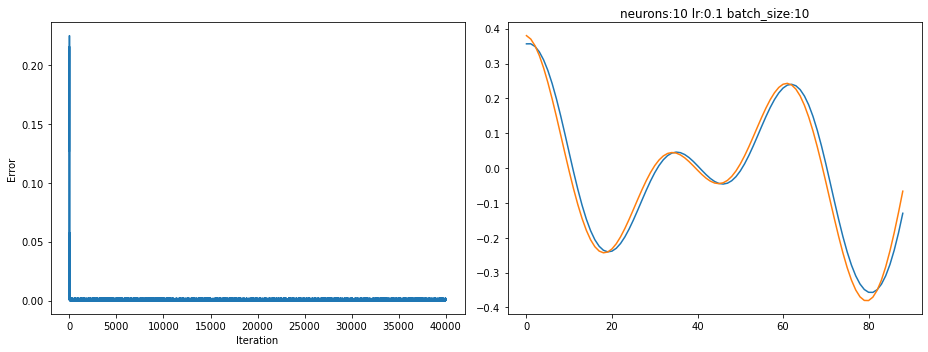

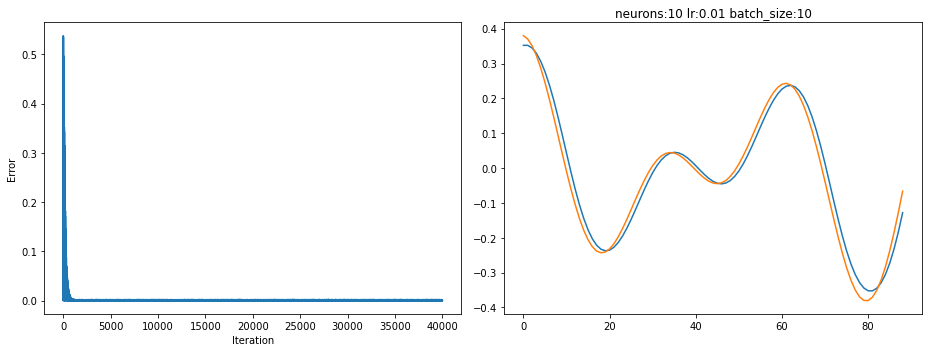

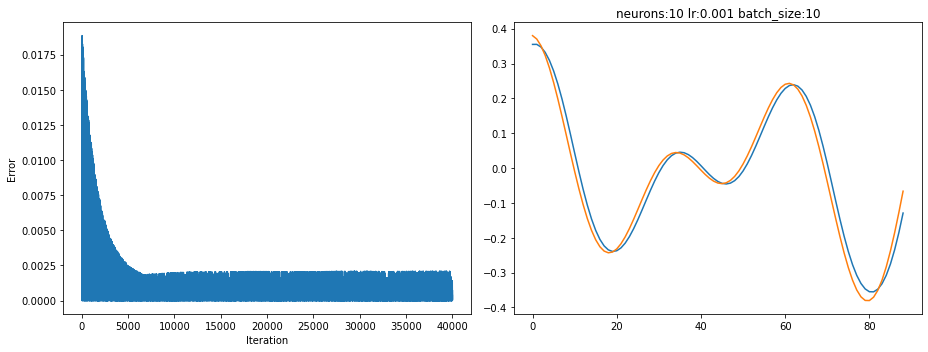

In [54]:
iterations = 40000

for batch_size in [1,2,3,5,10]:
    for neurons in [1,2,3,5,10]:
        for lr_rate in [0.1, 0.01, 0.001]:
            train_rnn(neurons, lr_rate, batch_size, iterations, disable_w=True)

We see that when we set w = 0, there is not disturbance from the t-1 inputs, so it is easier for our model to find a set of weights which basically predict same value as that of what is provided in the inputs.

When w is not equal to zero, the activation potential changes from the t-1 layers. Causing the convergence difficult.
When w is set to zero, there is minimal disturbance from the t-1 and other historiccal layers, making it easier for our model to find the optimal weights.